In [1]:
%%capture out
!pip install gdown

In [25]:
import os
import shutil
import torch
from torchvision.models.detection import keypointrcnn_resnet50_fpn
import torchvision.transforms as T
import cv2
import matplotlib.colors 
import matplotlib.pyplot as plt
import numpy as np
import gdown
import math
import time
from IPython.display import FileLink

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [3]:
OUT = '/kaggle/working/'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') 
print(f'Using {device} device')

Using cpu device


In [14]:
for p in ['/kaggle/working/test.mp4', '/kaggle/working/ref.mp4']:
    if os.path.exists(p):
        os.remove(p)


!gdown 1yjUp748qOIPDgfLKLpAyG1xoznHJlSp0 #ref
!gdown 1xYlfc_TpneXZ4mFHEaJY0atmjLJpQFMf #running man
!gdown 1Ci9Wfu7SgEIImFotlpsXqFeQdY0akj3u #standing woman
!gdown 1j5W84bn9GfIlQJdv9MA0FQiQ3yllzNxo #yoga woman
!gdown 1hekzIc__FLuqz0jwqz1zmmIX0J21Juzn #sitting man

!gdown 1SIqkfph61LljfAvGAh1zT6UXVAg1RL0o #ref video
!gdown 1_8aqONh8DUGHBhxMY7MX_sqRSDjAsktg #test video


Downloading...
From: https://drive.google.com/uc?id=1yjUp748qOIPDgfLKLpAyG1xoznHJlSp0
To: /kaggle/working/runner.png
100%|██████████████████████████████████████| 1.48M/1.48M [00:00<00:00, 82.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1xYlfc_TpneXZ4mFHEaJY0atmjLJpQFMf
To: /kaggle/working/runner2.jpg
100%|████████████████████████████████████████| 104k/104k [00:00<00:00, 80.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Ci9Wfu7SgEIImFotlpsXqFeQdY0akj3u
To: /kaggle/working/standwom.png
100%|██████████████████████████████████████| 75.5k/75.5k [00:00<00:00, 50.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1j5W84bn9GfIlQJdv9MA0FQiQ3yllzNxo
To: /kaggle/working/yogawom.jpg
100%|██████████████████████████████████████| 30.8k/30.8k [00:00<00:00, 59.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1hekzIc__FLuqz0jwqz1zmmIX0J21Juzn
To: /kaggle/working/sittingman.jpg
100%|██████████████████████████████████████| 48.7k/48.7k [00:00<00:00, 53.0MB/s]
Do

In [5]:
def get_limbs_from_keypoints(keypoints):
    """ Turn name into index in body point pairs """
    pairs = [("right_eye", "nose"),
             ("right_eye", "right_ear"),
             ("left_eye", "nose"),
             ("left_eye", "left_ear"),
             ("right_shoulder", "right_elbow"),
             ("right_elbow", "right_wrist"),
             ("left_shoulder", "left_elbow"),
             ("left_elbow", "left_wrist"),
             ("right_hip", "right_knee"),
             ("right_knee", "right_ankle"),
             ("left_hip", "left_knee"),
             ("left_knee", "left_ankle"),
             ("right_shoulder", "left_shoulder"),
             ("right_hip", "left_hip"),
             ("right_shoulder", "right_hip"),
             ("left_shoulder", "left_hip"),
            ]
    limbs = [[keypoints.index(v[0]), keypoints.index(v[1]),v[0],v[1]] for v in pairs]
    return limbs


points = ['nose','left_eye','right_eye', 'left_ear','right_ear','left_shoulder', 
          'right_shoulder', 'left_elbow','right_elbow', 'left_wrist','right_wrist',
          'left_hip', 'right_hip', 'left_knee', 'right_knee', 'left_ankle','right_ankle']

limbs = get_limbs_from_keypoints(points)

In [6]:
class Preprocessor():
    """ Image preprocessing, keypoints generation """
    def __init__(self, image, conf=0.95, crop=False):
        self.model = keypointrcnn_resnet50_fpn(weights='DEFAULT')
        self.conf = conf
        self.crop = crop
        self.img = image
        self.prediction = self.get_keypoints()
        self.keypoints = self.prediction['keypoints'][0].detach().numpy()[:,:2]
        self.kp_scores = self.prediction['keypoints_scores'][0].detach().numpy()
        self.boxes = self.prediction['boxes'][0].detach().numpy()
        self.img_crop, self.keypoints_crop = self.rescale()
        
    def image_rgb(self, totensor=True):
        """ Image to numpy ar tensor """
        path = self.img
        im = cv2.imread(path)
        im = np.flip(im,2)
        if self.crop:
            crop_size = np.min(im.shape[:2]) * self.crop
            im_tensor = T.Compose([T.ToTensor(),T.CenterCrop(crop_size)])
        else:
            im_tensor = T.Compose([T.ToTensor()])
        im_tensor = im_tensor(im.copy())
        if totensor:
            return im_tensor
        else:
            return im_tensor.permute(1,2,0).detach().numpy()

    def get_keypoints(self):
        """ Generate keypoints using the model """
        self.model.eval()
        pred = self.model([self.image_rgb()])[0]
        pred = dict((k,v[n].unsqueeze(0)) for k,v in pred.items() for n,score in enumerate(pred['scores']) if score > self.conf)
        return pred
    
    def rescale(self):
        """ Crop image using generated instance's box coordinates, image resize """
        img_copy = self.image_rgb(totensor=False).copy()
        keypoints = self.keypoints.copy()

        max_x = int(self.boxes[2])
        min_x = int(self.boxes[0])
        max_y = int(self.boxes[3])
        min_y = int(self.boxes[1])

        img_crop = img_copy[min_y:max_y, min_x:max_x]
        img_crop_resize = cv2.resize(img_crop, (500,500))
        x_coef = img_crop_resize.shape[1] / img_crop.shape[1]
        y_coef = img_crop_resize.shape[0] / img_crop.shape[0]
        keypoints[:,0] = (keypoints[:,0]-min_x) * x_coef
        keypoints[:,1] = (keypoints[:,1]-min_y) * y_coef
        
        return img_crop_resize, keypoints

    def draw_keypoints(self, coefs=[0.0], crop=True):
        """ Key points visualization, coloring limb according to vector similarity """
        if crop:
            img = self.img_crop.copy()
            keypoints = self.keypoints_crop.copy()
        else:
            img = self.image_rgb(totensor=False).copy()
            keypoints = self.keypoints.copy()
            
        for i, li in enumerate(limbs):
            if len(coefs)==1:
                coef = coefs[0]
            else:
                coef = coefs[i] 
                
            col = 0.35 - coef
            
            if col < 0:
                col = 0
            rgb = matplotlib.colors.hsv_to_rgb([col, 1.0, 1.0])
            # join the keypoint pairs to draw the skeletal structure
            cv2.line(img, 
                    (int(keypoints[li[:2], 0][0]), int(keypoints[li[:2], 1][0])),
                    (int(keypoints[li[:2], 0][1]), int(keypoints[li[:2], 1][1])),
                    color=tuple(rgb), 
                    thickness=3) 
        return img

Downloading: "https://download.pytorch.org/models/keypointrcnn_resnet50_fpn_coco-fc266e95.pth" to /root/.cache/torch/hub/checkpoints/keypointrcnn_resnet50_fpn_coco-fc266e95.pth
100%|██████████| 226M/226M [00:02<00:00, 92.8MB/s] 


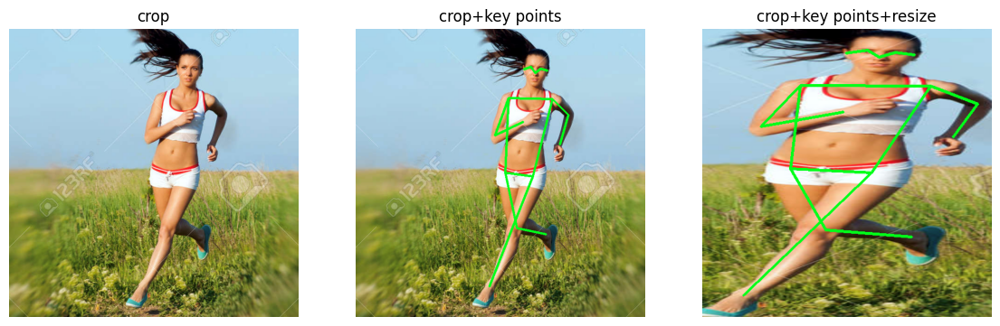

CPU times: user 7.99 s, sys: 2.1 s, total: 10.1 s
Wall time: 8.57 s


In [7]:
%%time
# test image visualization
# resized & croped image and key points coordinates are used for distances calculation indeed

im = Preprocessor(OUT + 'runner.png', crop=0.7)

f,a = plt.subplots(1,3,figsize=(14,7))
a[0].imshow(im.image_rgb(totensor=False))
a[0].set(title='crop')
a[0].set_axis_off()

a[1].imshow(im.draw_keypoints(crop=False))
a[1].set(title='crop+key points')
a[1].set_axis_off()

a[2].imshow(im.draw_keypoints(crop=True))
a[2].set(title='crop+key points+resize')
a[2].set_axis_off()

plt.show()

In [ ]:
class Comparator():
    """ Compare reference and test images, define metrics, draw image pairs """
    def __init__(self, img1, img2, crops=[False, False], save=False):
        self.img1 = Preprocessor(img1, crop=crops[0])
        self.img2 = Preprocessor(img2, crop=crops[1])
        self.save = save
        self.cosine_dist = self.cosine_distance(self.img1.keypoints_crop, self.img2.keypoints_crop)
        self.weight_dist = self.weight_distance(self.img1.keypoints_crop, self.img2.keypoints_crop, self.img1.kp_scores)
        #self.cosine_dist = self.cosine_distance(self.img1.keypoints, self.img2.keypoints)
        #self.weight_dist = self.weight_distance(self.img1.keypoints, self.img2.keypoints, self.img1.kp_scores)
    
    def cosine_distance(self, pose1, pose2, norm=True):
        """ Calculate cosine distance """
        pose1_norm = pose1.copy()
        pose2_norm = pose2.copy()
        if norm:
            pose1_norm[:,0] = (pose1_norm[:,0]) / np.linalg.norm((pose1_norm[:,0])) 
            pose1_norm[:,1] = (pose1_norm[:,1]) / np.linalg.norm((pose1_norm[:,1])) 
            pose2_norm[:,0] = (pose2_norm[:,0]) / np.linalg.norm((pose2_norm[:,0])) 
            pose2_norm[:,1] = (pose2_norm[:,1]) / np.linalg.norm((pose2_norm[:,1])) 
            
            pose1_norm = np.concatenate(pose1_norm)
            pose2_norm = np.concatenate(pose2_norm)
    
        cossin = pose1_norm.dot(np.transpose(pose2_norm)) / (
            np.linalg.norm(pose1_norm) * np.linalg.norm(pose2_norm)
            )
        if 1-cossin<0: 
            return 0
        else:
            return np.sqrt(2*(1-cossin))
    
    def weight_distance(self, pose1, pose2, conf1):
        """ Calculate weight distance """
        # D(U,V) = (1 / sum(conf1)) * sum(conf1 * ||pose1 - pose2||) = sum1 * sum2
        pose1_norm = pose1.copy()
        pose2_norm = pose2.copy()
        
        pose1_norm[:,0] = (pose1_norm[:,0]) / np.linalg.norm((pose1_norm[:,0])) 
        pose1_norm[:,1] = (pose1_norm[:,1]) / np.linalg.norm((pose1_norm[:,1])) 
        pose2_norm[:,0] = (pose2_norm[:,0]) / np.linalg.norm((pose2_norm[:,0])) 
        pose2_norm[:,1] = (pose2_norm[:,1]) / np.linalg.norm((pose2_norm[:,1])) 
        
        pose1_norm = np.concatenate(pose1_norm)
        pose2_norm = np.concatenate(pose2_norm)

        sum1 = 1 / np.sum(conf1)
        
        sum2 = 0
        for i in range(len(pose1)):
            conf_ind = math.floor(i / 2)
            sum2 += conf1[conf_ind] * abs(pose1_norm[i] - pose2_norm[i])

        return sum1 * sum2

    def cosine_dist_pair(self):
        """ Calculate cosine distance for limbs, for score-related visualization """
        cosdis = []
        for pair in limbs:
            pair_vec = self.img1.keypoints_crop[pair[0]]-self.img1.keypoints_crop[pair[1]]
            inp_vec = self.img2.keypoints_crop[pair[0]]-self.img2.keypoints_crop[pair[1]]
            cosdis.append(self.cosine_distance(pair_vec, inp_vec, norm=False))
        #print(cosdis)
        return cosdis
    
    def draw_pair(self):
        """ Reference and test image visualization, drawing test-image frame and limbs with metric-dependent color indication """
        fig,a = plt.subplots(1,2,figsize=(12,6))
        a[0].imshow(self.img1.draw_keypoints(crop=False))
        a[0].set(title='REFERENCE')
        a[0].set_axis_off()
        a[1].imshow(self.img2.draw_keypoints(coefs=self.cosine_dist_pair(), crop=False))
        a[1].set(title='TEST')
        a[1].spines['top'].set_visible(True)
        
        a[1].spines['right'].set_visible(True)
        a[1].spines['bottom'].set_visible(True)
        a[1].spines['left'].set_visible(True)
        
        #col = 0.3 - self.weight_dist * 10
        col = 0.28 - self.cosine_dist
        if col < 0:
            col = 0
        for spine in a[1].spines.values():
            spine.set_edgecolor(tuple(matplotlib.colors.hsv_to_rgb([col, 1.0, 1.0])))
            spine.set_linewidth(10.0) 

        plt.xticks([])
        plt.yticks([])
        plt.text(0, 0, 
                 f"cos: {round(float(self.cosine_dist),3)}\nwei: {round(float(self.weight_dist),3)}", 
                 fontsize = 14,
                 color = 'white',
                 verticalalignment ='top',  
                 horizontalalignment ='left',
                 bbox ={'facecolor':'black', 'pad':5}) 
        plt.tight_layout()
        
        if self.save:
            plt.savefig(self.save)
        
        plt.show()
        plt.close()
       

**************************************************
runner.png
Cosine distance: 0
Weight distance: 0.0


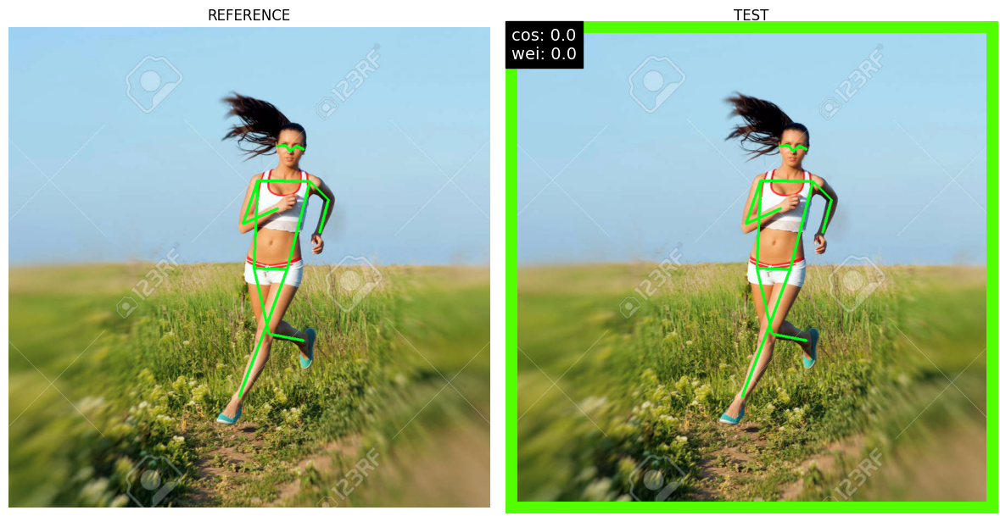

**************************************************
yogawom.jpg
Cosine distance: 0.3314973015999038
Weight distance: 0.03281321737189751


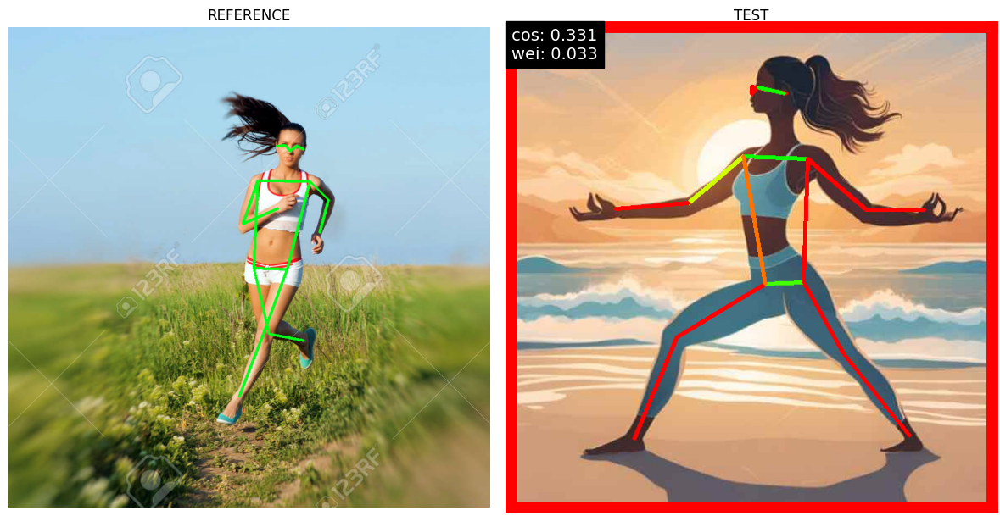

**************************************************
runner2.jpg
Cosine distance: 0.2780788511929196
Weight distance: 0.026634260467002648


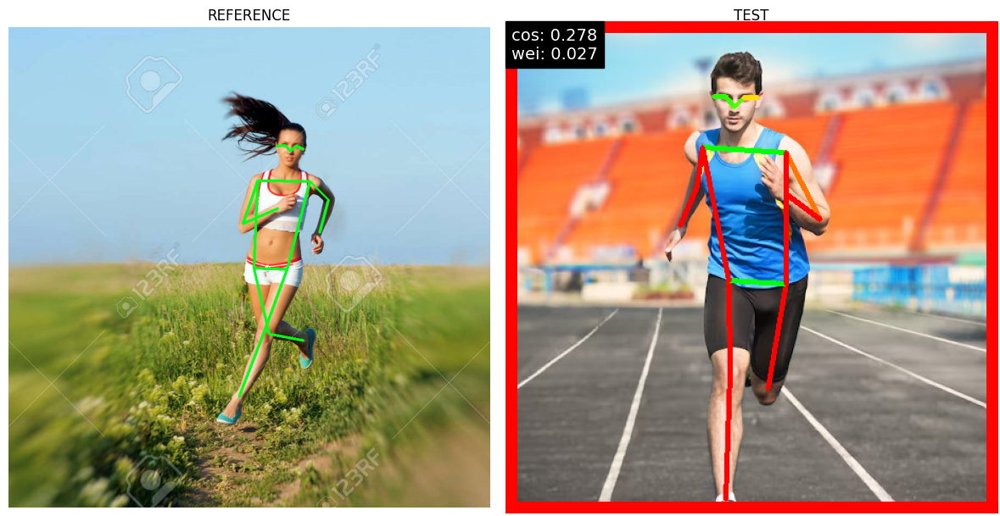

**************************************************
sittingman.jpg
Cosine distance: 0.44759293619433593
Weight distance: 0.05852915286223929


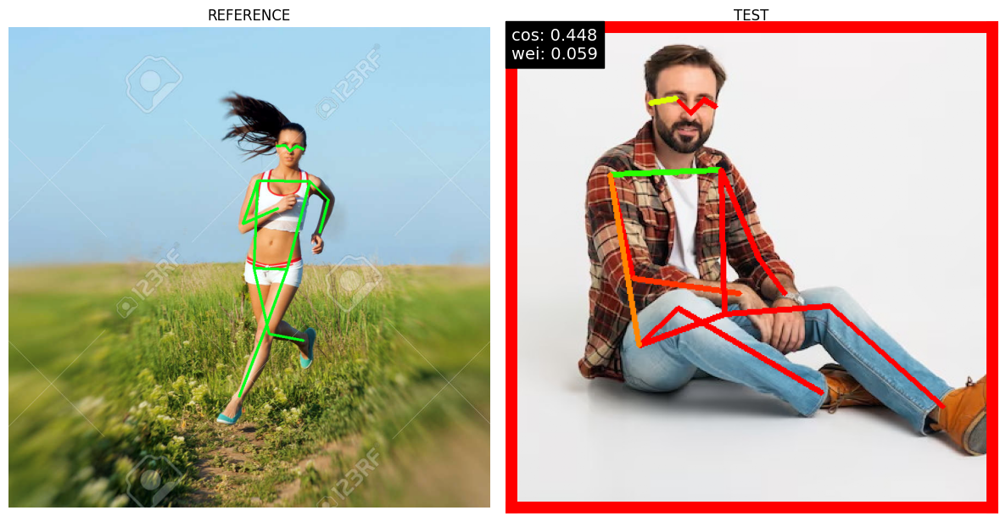

In [9]:
for i in ['runner.png', 'yogawom.jpg', 'runner2.jpg', 'sittingman.jpg']:
    w = Comparator(OUT+'runner.png', OUT+i, crops=[1.0, 1.0])
    print('*' * 50)
    print(i)
    print('Cosine distance:', w.cosine_dist)
    print('Weight distance:', w.weight_dist)
    w.draw_pair()  

    Both metrics provide poses-similarity-dependent scores: the more reference and test images are similar, the smaller values are displayed; visualization technique takes into account the poses similarity/distance value: the lower the metrics values (higher poses similarity), the greener coloring; high distance (low poses similarity) lead to red coloring.

In [15]:
# folders arrangement for images and video generation
frame_path = '/kaggle/working/frames/'
if os.path.exists(frame_path):
    shutil.rmtree(frame_path)

os.mkdir(frame_path)
os.mkdir(frame_path + 'ref/')
os.mkdir(frame_path + 'inp/')
os.mkdir(frame_path + 'combo/')
!ls /kaggle/working/frames/

combo  inp  ref


In [16]:
video_1 = "ref.mp4"
video_2 = "test.mp4"

for v,p in zip([video_1, video_2], ['ref/', 'inp/']):
    count = 1000
    cap = cv2.VideoCapture(OUT + v) 
    while(cap.isOpened()):
        ret, frame = cap.read()
        if (ret != True):
            break
        filename =frame_path + p +"frame%d.jpg" % count;count+=1
        cv2.imwrite(filename, frame)
        
    print(f"{v} framed successfully to {p}")
    print('-----fps: ', round(cap.get(cv2.CAP_PROP_FPS)))
    print('--frames: ', round(cap.get(cv2.CAP_PROP_FRAME_COUNT)))
    
    cap.release()

ref.mp4 framed successfully to ref/
-----fps:  30
--frames:  1620
test.mp4 framed successfully to inp/
-----fps:  30
--frames:  1623


**************************************************
frame:  frame1288.jpg
Cosine distance: 0.12922
Weight distance: 0.04246


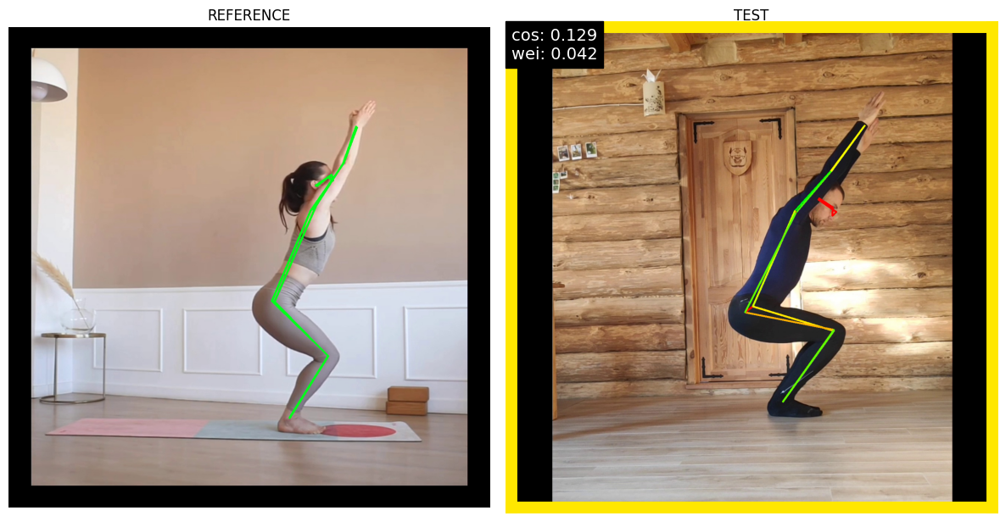

**************************************************
frame:  frame1400.jpg
Cosine distance: 0.05274
Weight distance: 0.00632


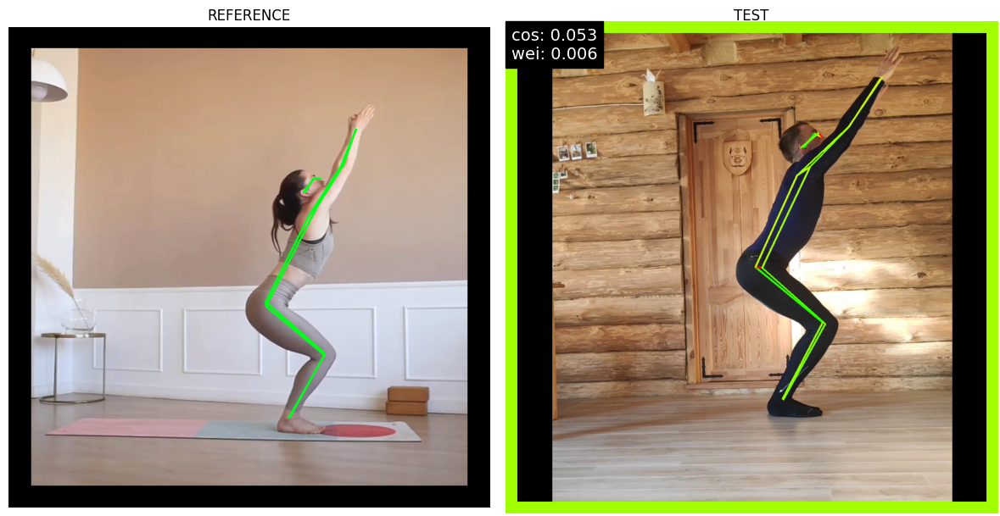

**************************************************
frame:  frame1710.jpg
Cosine distance: 0.04989
Weight distance: 0.01122


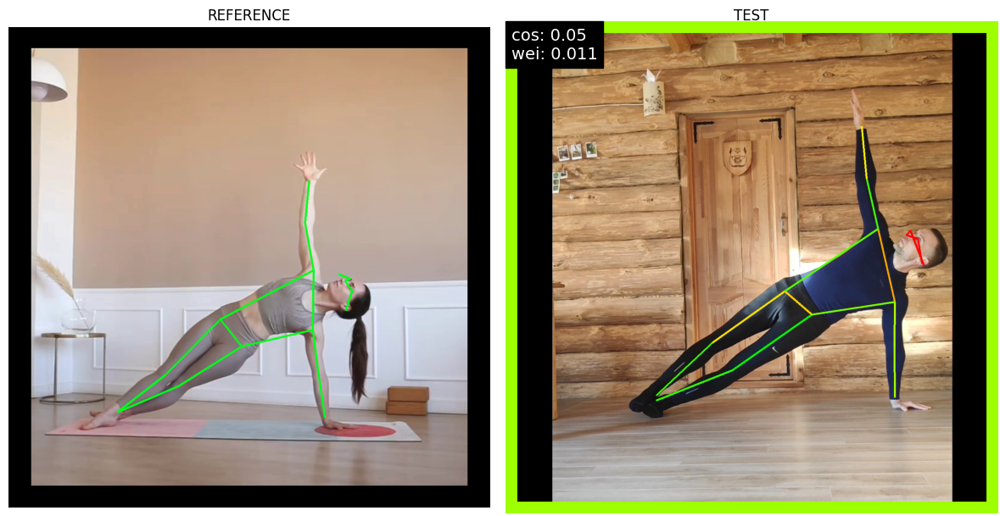

**************************************************
frame:  frame1850.jpg
Cosine distance: 0.0934
Weight distance: 0.02


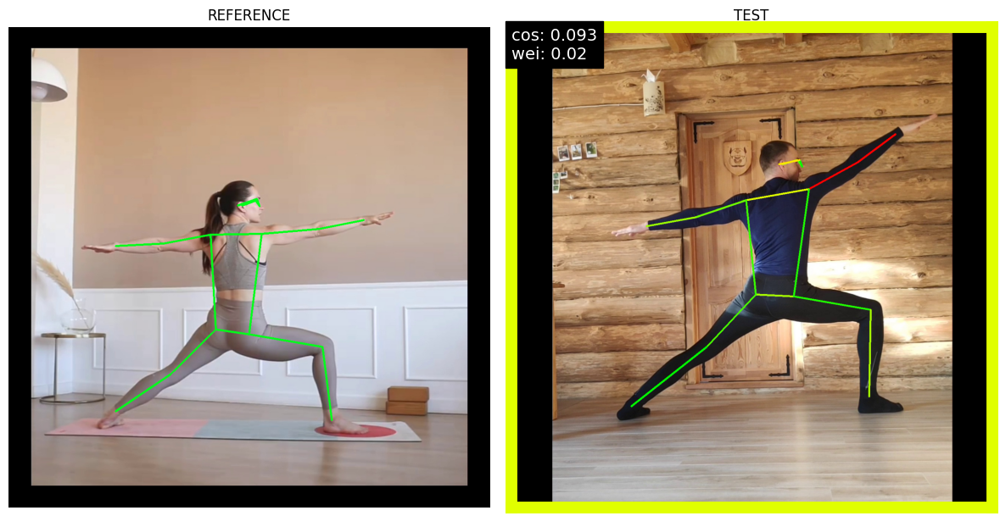

**************************************************
frame:  frame1940.jpg
Cosine distance: 0.05314
Weight distance: 0.00733


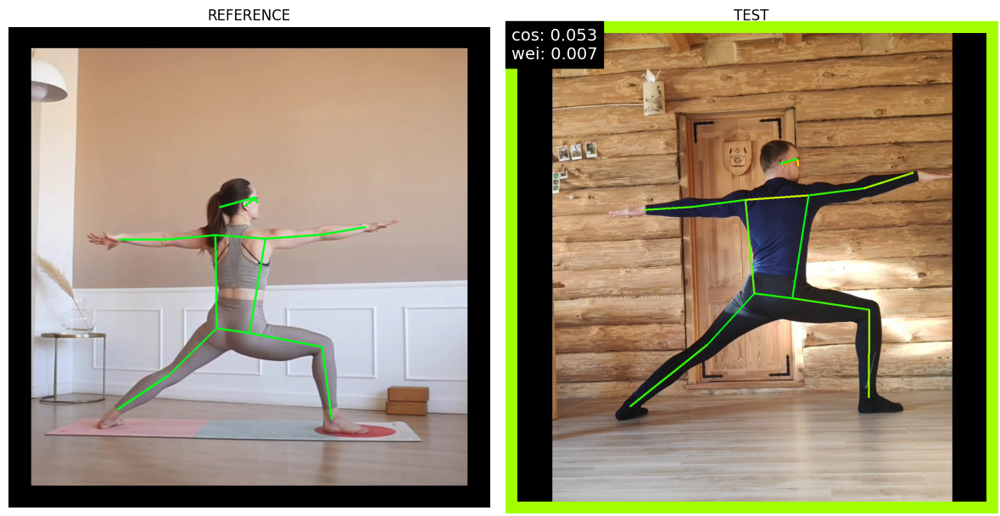

**************************************************
frame:  frame2120.jpg
Cosine distance: 0.24889
Weight distance: 0.06342


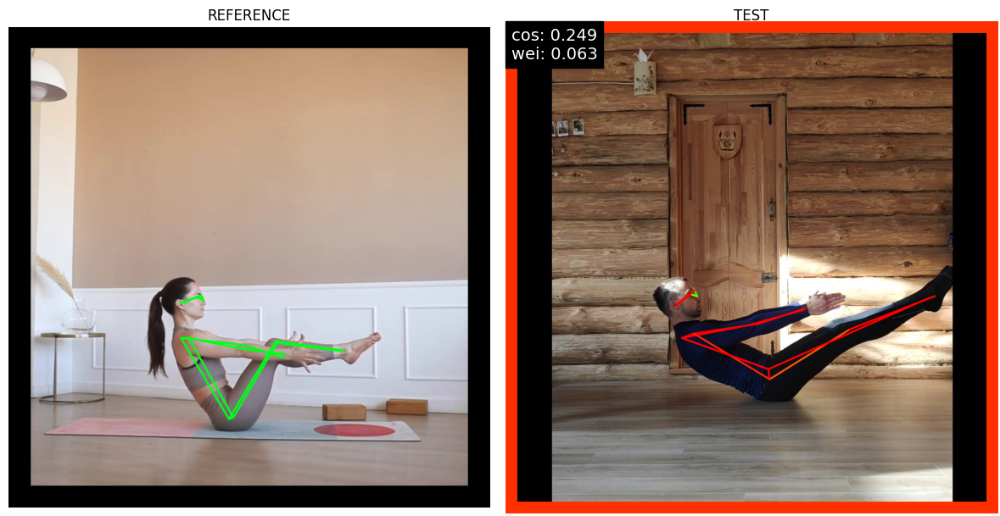

**************************************************
frame:  frame2210.jpg
Cosine distance: 0.16072
Weight distance: 0.01474


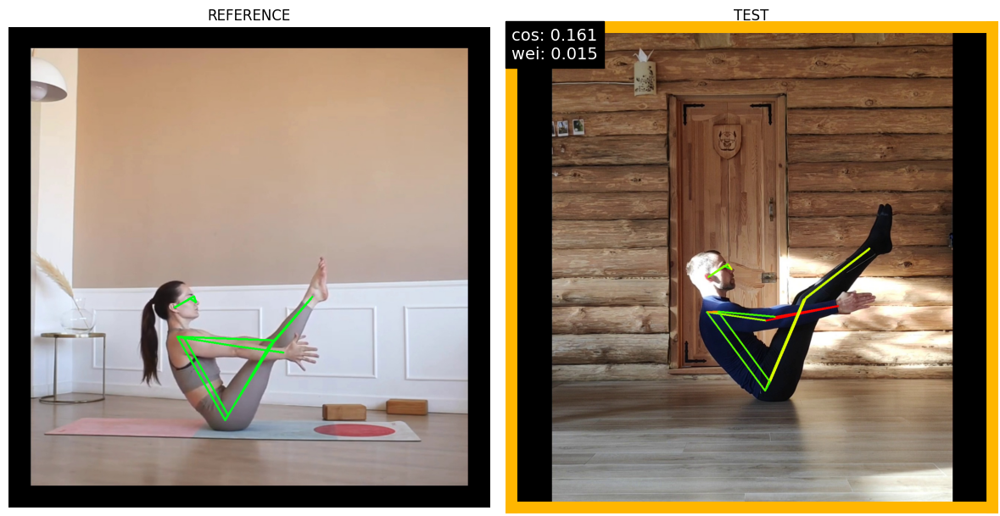

**************************************************
frame:  frame2450.jpg
Cosine distance: 0.09876
Weight distance: 0.01768


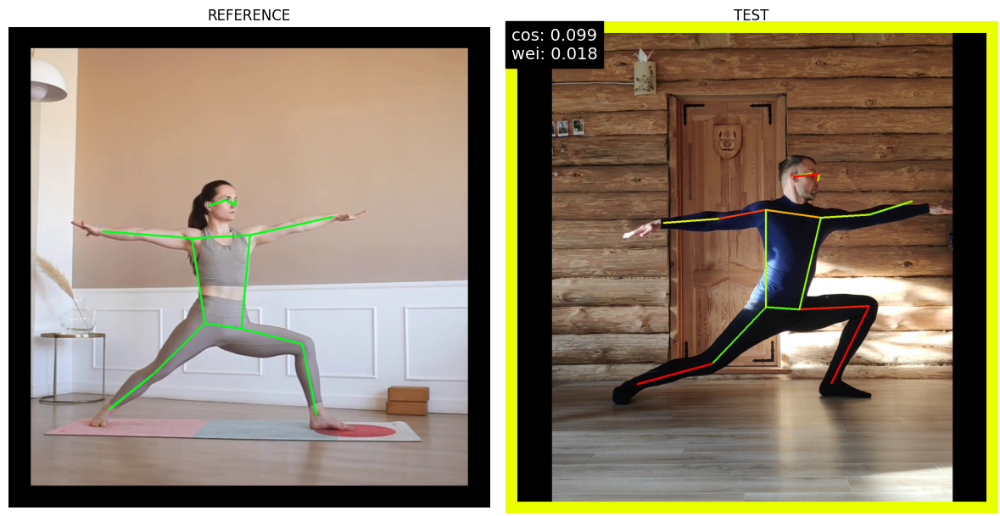

In [23]:
# compare test with reference, draw limbs colors in metric-dependent style

#inds = np.random.choice(len(os.listdir('/kaggle/working/frames/ref')), 5, replace=False)
inds = [288, 400, 710, 850, 940, 1120, 1210, 1450]  
totest= sorted(os.listdir('/kaggle/working/frames/ref'))
test_rand = [totest[i] for i in inds]

for n in test_rand:
    w = Comparator(
        frame_path+'ref/'+n, 
        frame_path+'inp/'+n, 
        crops=[1.1, 1.2])
    
    print('*' * 50)
    print('frame: ', n)
    print('Cosine distance:', round(w.cosine_dist,5))
    print('Weight distance:', round(w.weight_dist,5))
    w.draw_pair()  



Let's save reference-test images pairs with limbs colored in metric-dependent style. These images (=frames) will be used for video generation. 

In [26]:
%%capture out
start_time = time.time()
for n in totest:
    w = Comparator(
        frame_path+'ref/'+n, 
        frame_path+'inp/'+n, 
        crops=[1.1, 1.2], 
        save=frame_path + 'combo/' + n)
    w.draw_pair()  

time_get_frames = round((time.time() - start_time)/60, 2)

In [27]:
print(f"Time elapsed to generate frames: {time_get_frames} min")
print('Frames to combine: ', len(os.listdir(frame_path + 'combo/')))

Time elapsed to generate frames: 250.64 min
Frames to combine:  1620


In [28]:
def generate_video(image_folder, video_name):
    """ Create video from images in image_folder """

    images = os.listdir(image_folder)
    
    # Set frame from the first image
    frame = cv2.imread(os.path.join(image_folder, images[0]))
    height, width, layers = frame.shape

    # Video writer to create .avi file
    video = cv2.VideoWriter(video_name, cv2.VideoWriter_fourcc(*'DIVX'), 24, (width, height))

    # Appending images to video
    for image in sorted(images):
        video.write(cv2.imread(os.path.join(image_folder, image)))

    video.release()
    cv2.destroyAllWindows()
    print(f"Video {video_name} generated SUCCESSFULLY!")


generate_video(frame_path + 'combo/', 'combo.avi')

FileLink(r'combo.avi')

Video combo.avi generated SUCCESSFULLY!


/kaggle/working/combo.avi

### Video of yoga trainee pose-execution in comparison with a reference is available here: 

https://drive.google.com/file/d/11a7uKdTXzNXmnAXWYMG_hGRPH8ldDzvE/view?usp=sharing